In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import ast

In [3]:
df = pd.read_csv('orientation_log.csv').head(100)


In [4]:
for q in ['q0', 'q1', 'q2', 'q3']:
    df[q] = df[q].apply(lambda x: ast.literal_eval(x)[0])

df[['q0','q1','q2','q3']].dtypes

q0    float64
q1    float64
q2    float64
q3    float64
dtype: object

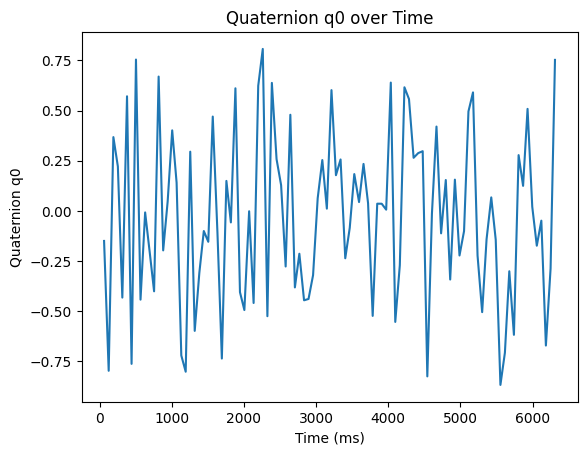

In [5]:
plt.plot(df['time_ms'], df['q0'])
plt.xlabel('Time (ms)')
plt.ylabel('Quaternion q0')
plt.title('Quaternion q0 over Time')
plt.show()


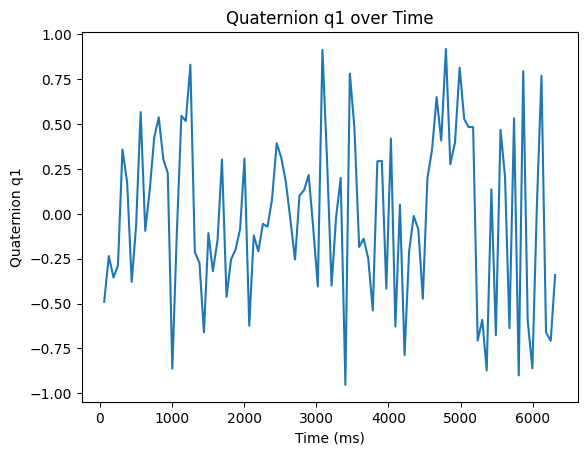

In [6]:
plt.plot(df['time_ms'], df['q1'])
plt.xlabel('Time (ms)')
plt.ylabel('Quaternion q1')
plt.title('Quaternion q1 over Time')
plt.show()

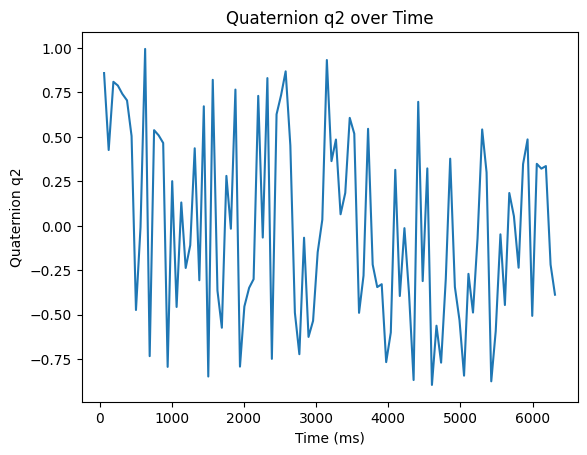

In [7]:
plt.plot(df['time_ms'], df['q2'])
plt.xlabel('Time (ms)')
plt.ylabel('Quaternion q2')
plt.title('Quaternion q2 over Time')
plt.show()

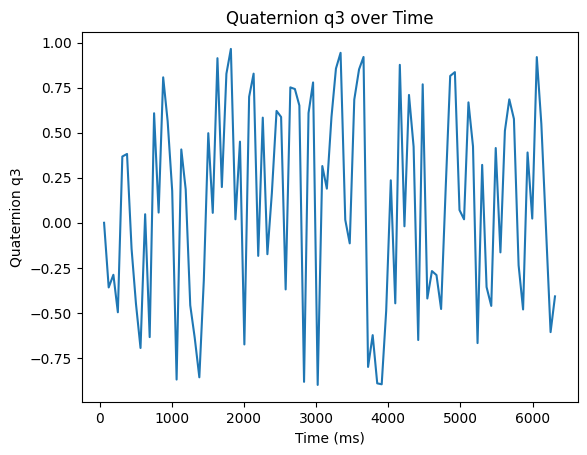

In [8]:
plt.plot(df['time_ms'], df['q3'])
plt.xlabel('Time (ms)')
plt.ylabel('Quaternion q3')
plt.title('Quaternion q3 over Time')
plt.show()

In [9]:
from scipy.spatial.transform import Rotation as R
rot = R.from_quat(df[['q1','q2','q3','q0']].values)
euler = rot.as_euler('xyz', degrees=True)
df['roll'] = euler[:, 0]
df['pitch'] = euler[:, 1]
df['yaw'] = euler[:, 2]

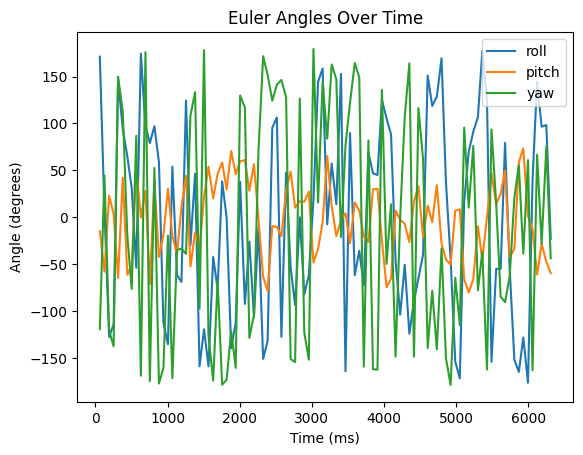

In [10]:
plt.plot(df['time_ms'], df[['roll','pitch','yaw']])
plt.legend(['roll','pitch','yaw'])
plt.xlabel('Time (ms)')
plt.ylabel('Angle (degrees)')
plt.title('Euler Angles Over Time')
plt.show()


In [11]:
"""
Animation Code - Not Used Currently
"""

'\nAnimation Code - Not Used Currently\n'

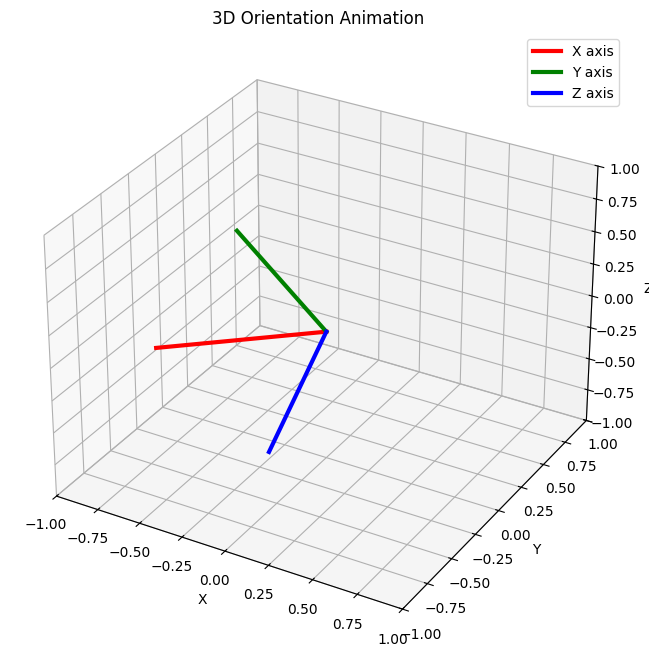

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Extract rotation matrices from the rotations object
rotation_matrices = rot.as_matrix()

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

# Axis limits
ax.set_xlim([-1, 1])
ax.set_ylim([-1, 1])
ax.set_zlim([-1, 1])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Orientation Animation')

# Create line objects for x, y, z axes
x_line, = ax.plot([], [], [], 'r-', lw=3, label='X axis')
y_line, = ax.plot([], [], [], 'g-', lw=3, label='Y axis')
z_line, = ax.plot([], [], [], 'b-', lw=3, label='Z axis')

def update(frame):
    Rm = rotation_matrices[frame]

    # Unit axes transformed by quaternion
    x_axis = Rm @ np.array([1,0,0])
    y_axis = Rm @ np.array([0,1,0])
    z_axis = Rm @ np.array([0,0,1])

    # Update line data for 3D plots
    x_line.set_data_3d([0, x_axis[0]], [0, x_axis[1]], [0, x_axis[2]])
    y_line.set_data_3d([0, y_axis[0]], [0, y_axis[1]], [0, y_axis[2]])
    z_line.set_data_3d([0, z_axis[0]], [0, z_axis[1]], [0, z_axis[2]])

    return x_line, y_line, z_line

anim = FuncAnimation(fig, update, frames=len(df), interval=100, blit=False, repeat=True)
plt.legend()

# Display animation as HTML5 video
HTML(anim.to_jshtml())
